# **LOW LIGHT IMAGE ENHANCEMENT**
# ZeroDCE IMPLEMENTATION

## Fetching Dataset From Kaggle

In [1]:
!pip install kaggle

In [2]:
from google.colab import drive
drive.mount('/content/drive');

Mounted at /content/drive


In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sricharan2901","key":"aa6a0772a689efbbe9d7153136d84a5a"}'}

In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [5]:
 !kaggle datasets download soumikrakshit/lol-dataset

Dataset URL: https://www.kaggle.com/datasets/soumikrakshit/lol-dataset
License(s): unknown
 98% 325M/331M [00:03<00:00, 107MB/s] 
100% 331M/331M [00:03<00:00, 112MB/s]


In [6]:
!unzip lol-dataset.zip

Archive:  lol-dataset.zip
  inflating: lol_dataset/eval15/high/1.png  
  inflating: lol_dataset/eval15/high/111.png  
  inflating: lol_dataset/eval15/high/146.png  
  inflating: lol_dataset/eval15/high/179.png  
  inflating: lol_dataset/eval15/high/22.png  
  inflating: lol_dataset/eval15/high/23.png  
  inflating: lol_dataset/eval15/high/493.png  
  inflating: lol_dataset/eval15/high/547.png  
  inflating: lol_dataset/eval15/high/55.png  
  inflating: lol_dataset/eval15/high/665.png  
  inflating: lol_dataset/eval15/high/669.png  
  inflating: lol_dataset/eval15/high/748.png  
  inflating: lol_dataset/eval15/high/778.png  
  inflating: lol_dataset/eval15/high/780.png  
  inflating: lol_dataset/eval15/high/79.png  
  inflating: lol_dataset/eval15/low/1.png  
  inflating: lol_dataset/eval15/low/111.png  
  inflating: lol_dataset/eval15/low/146.png  
  inflating: lol_dataset/eval15/low/179.png  
  inflating: lol_dataset/eval15/low/22.png  
  inflating: lol_dataset/eval15/low/23.png  
  i

## ZeroDCE Model

In [7]:
import os
os.environ["KERAS_BACKEND"] = "tensorflow" #Using Tensorflow Backend

import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

import keras
from keras import layers
import tensorflow as tf

In [8]:
IMAGE_SIZE = 256
MAX_TRAIN_IMAGES = 400
BATCH_SIZE = 16

#Function to load data from the Dataset to Tensor Decoded format
def load_data(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_png(image, channels = 3)
  image = tf.image.resize(images = image, size = [IMAGE_SIZE, IMAGE_SIZE])
  image = image / 255.0
  return image

#Function to get the batches of data of low light images
def data_generator(low_light_images):
  dataset = tf.data.Dataset.from_tensor_slices((low_light_images))
  dataset = dataset.map(load_data, num_parallel_calls = tf.data.AUTOTUNE)
  dataset = dataset.batch(BATCH_SIZE, drop_remainder = True)
  return dataset

train_low_light_images = sorted(glob("./lol_dataset/our485/low/*"))[:MAX_TRAIN_IMAGES]
val_low_light_images = sorted(glob("./lol_dataset/our485/low/*"))[MAX_TRAIN_IMAGES:]
test_low_light_images = sorted(glob("./lol_dataset/eval15/low/*"))


train_dataset = data_generator(train_low_light_images)
val_dataset = data_generator(val_low_light_images)

print("Training Dataset: ", train_dataset)
print("Validation Dataset: ", val_dataset)


Training Dataset:  <_BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>
Validation Dataset:  <_BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>


Framework for the model

In [9]:
def build_dce_net():
  input_img = keras.Input(shape = [None, None, 3])

  conv1 = layers.Conv2D(32, (3,3), strides = (1,1), activation = "relu", padding = "same")(input_img)
  conv2 = layers.Conv2D(32, (3,3), strides = (1,1), activation = "relu", padding = "same")(conv1)
  conv3 = layers.Conv2D(32, (3,3), strides = (1,1), activation = "relu", padding = "same")(conv2)
  conv4 = layers.Conv2D(32, (3,3), strides = (1,1), activation = "relu", padding = "same")(conv3)
  conc1 = layers.Concatenate(axis = -1)([conv4, conv3])

  conv5 = layers.Conv2D(32, (3,3), strides = (1,1), activation = "relu", padding = "same")(conc1)
  conc2 = layers.Concatenate(axis = -1)([conv5, conv2])

  conv6 = layers.Conv2D(32, (3,3), strides = (1,1), activation = "relu", padding = "same")(conc2)
  conc3 = layers.Concatenate(axis = -1)([conv6, conv1])

  x_r = layers.Conv2D(24,(3,3), strides = (1,1), activation = "tanh", padding = "same")(conc3)
  return keras.Model(inputs = input_img, outputs = x_r)

Color Constancy Loss to Possibly correct color deviations

In [10]:
def color_constancy_loss(x):
  mean_rgb = tf.reduce_mean(x, axis = (1,2), keepdims = True)
  mr, mg, mb = (
      mean_rgb[:,:,:,0],
      mean_rgb[:,:,:,1],
      mean_rgb[:,:,:,2],
  )
  d_rg = tf.square(mr- mg)
  d_rb = tf.square(mr - mb)
  d_gb = tf.square(mg - mb)
  return tf.sqrt(tf.square(d_rg) + tf.square(d_rb) + tf.square(d_gb))

Exposure Loss to restrain under/over-exposed regions. It measures the distance between the average intensity value of a local region and a preset well-exposedness level. The average intensity value is set to `0.6`

In [12]:
def exposure_loss(x, mean_val = 0.6):
  x = tf.reduce_mean(x, axis = 3, keepdims = True)
  mean = tf.nn.avg_pool2d(x, ksize = 16, strides = 16, padding = "VALID")
  return tf.reduce_mean(tf.square(mean - mean_val))

Illumination Smoothness Loss to preserve the monotonicity relations between neighbouring pixels

In [11]:
def illumination_smoothness_loss(x):
  batch_size = tf.shape(x)[0]
  h_x = tf.shape(x)[1]
  w_x = tf.shape(x)[2]
  ch_x = tf.shape(x)[3]
  count_h = (w_x - 1) * ch_x
  count_w = w_x * (ch_x - 1)
  h_tv = tf.reduce_sum(tf.square((x[:,1:,:,:] - x[:,h_x - 1:,:,:])))
  w_tv = tf.reduce_sum(tf.square((x[:,:,1:,:] - x[:,:,w_x-1:,:])))
  batch_size = tf.cast(batch_size, dtype = tf.float32)
  count_h = tf.cast(count_h, dtype = tf.float32)
  count_w = tf.cast(count_w, dtype = tf.float32)
  return 2 * (h_tv / count_h + w_tv / count_w) / batch_size

Spatial Consistency Loss to preserve contrast between neighbouring regions across both input image and enhanced image

In [13]:
class SpatialConsistencyLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(reduction="none")

        self.left_kernel = tf.constant([[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype = tf.float32)
        self.right_kernel = tf.constant([[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype = tf.float32)
        self.up_kernel = tf.constant([[[[0, -1, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype = tf.float32)
        self.down_kernel = tf.constant([[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype = tf.float32)

    def call(self, y_true, y_pred):
        original_mean = tf.reduce_mean(y_true, 3, keepdims = True)
        enhanced_mean = tf.reduce_mean(y_pred, 3, keepdims = True)
        original_pool = tf.nn.avg_pool2d(original_mean, ksize = 4, strides = 4, padding = "VALID")
        enhanced_pool = tf.nn.avg_pool2d(enhanced_mean, ksize = 4, strides = 4, padding = "VALID")

        #For the original images
        d_original_left = tf.nn.conv2d(
            original_pool,
            self.left_kernel,
            strides = [1,1,1,1],
            padding = "SAME",
        )
        d_original_right = tf.nn.conv2d(
            original_pool,
            self.right_kernel,
            strides=[1,1,1,1],
            padding = "SAME",
        )
        d_original_up = tf.nn.conv2d(
            original_pool,
            self.up_kernel,
            strides=[1,1,1,1],
            padding = "SAME",
        )
        d_original_down = tf.nn.conv2d(
            original_pool,
            self.down_kernel,
            strides=[1,1,1,1],
            padding = "SAME",
        )

        #For the Enhanced images
        d_enhanced_left = tf.nn.conv2d(
            enhanced_pool,
            self.left_kernel,
            strides=[1,1,1,1],
            padding = "SAME",
        )
        d_enhanced_right = tf.nn.conv2d(
            enhanced_pool,
            self.right_kernel,
            strides=[1,1,1,1],
            padding = "SAME",
        )
        d_enhanced_up = tf.nn.conv2d(
            enhanced_pool,
            self.up_kernel,
            strides=[1,1,1,1],
            padding = "SAME",
        )
        d_enhanced_down = tf.nn.conv2d(
            enhanced_pool,
            self.down_kernel,
            strides=[1,1,1,1],
            padding = "SAME",
        )

        d_left = tf.square(d_original_left - d_enhanced_left)
        d_right = tf.square(d_original_right - d_enhanced_right)
        d_up = tf.square(d_original_up - d_enhanced_up)
        d_down = tf.square(d_original_down - d_enhanced_down)
        return d_left + d_right + d_up + d_down


Building the Model from the created ZeroDCE framework

In [14]:
import tensorflow as tf
from tensorflow import keras

class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.dce_model = build_dce_net()

    # Function to compile the model with given metrics
    def compile(self, learning_rate, **kwargs):
        super().compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.illumination_smoothness_loss_tracker = keras.metrics.Mean(name="illumination_smoothness_loss")
        self.spatial_constancy_loss_tracker = keras.metrics.Mean(name="spatial_constancy_loss")
        self.color_constancy_loss_tracker = keras.metrics.Mean(name="color_constancy_loss")
        self.exposure_loss_tracker = keras.metrics.Mean(name="exposure_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.illumination_smoothness_loss_tracker,
            self.spatial_constancy_loss_tracker,
            self.color_constancy_loss_tracker,
            self.exposure_loss_tracker,
        ]

    # Function to get the enhanced image post processing
    def get_enhanced_image(self, data, output):
        # 8 tensors, each having shape (batch_size, height, width, 3)
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        r3 = output[:, :, :, 6:9]
        r4 = output[:, :, :, 9:12]
        r5 = output[:, :, :, 12:15]
        r6 = output[:, :, :, 15:18]
        r7 = output[:, :, :, 18:21]
        r8 = output[:, :, :, 21:24]

        # Enhancing the images
        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)
        enhanced_image = x + r4 * (tf.square(x) - x)
        x = enhanced_image + r5 * (tf.square(enhanced_image) - enhanced_image)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)
        enhanced_image = x + r8 * (tf.square(x) - x)

        return enhanced_image

    # Function to get the output (enhanced image)
    def call(self, data):
        dce_net_output = self.dce_model(data)
        return self.get_enhanced_image(data, dce_net_output)

    # Function to compute the cumulative losses as well as individual losses and return it
    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(self.spatial_constancy_loss(enhanced_image, data))
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (loss_illumination + loss_spatial_constancy + loss_color_constancy + loss_exposure)

        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    # Function to do training, applying gradient tape for backprop
    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)

        gradients = tape.gradient(losses["total_loss"], self.dce_model.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        self.total_loss_tracker.update_state(losses["total_loss"])
        self.illumination_smoothness_loss_tracker.update_state(losses["illumination_smoothness_loss"])
        self.spatial_constancy_loss_tracker.update_state(losses["spatial_constancy_loss"])
        self.color_constancy_loss_tracker.update_state(losses["color_constancy_loss"])
        self.exposure_loss_tracker.update_state(losses["exposure_loss"])

        return {metric.name: metric.result() for metric in self.metrics}

    # Function to do testing, taking the remaining image data, and using the losses it computes the result
    def test_step(self, data):
        output = self.dce_model(data)
        losses = self.compute_losses(data, output)

        self.total_loss_tracker.update_state(losses["total_loss"])
        self.illumination_smoothness_loss_tracker.update_state(losses["illumination_smoothness_loss"])
        self.spatial_constancy_loss_tracker.update_state(losses["spatial_constancy_loss"])
        self.color_constancy_loss_tracker.update_state(losses["color_constancy_loss"])
        self.exposure_loss_tracker.update_state(losses["exposure_loss"])

        return {metric.name: metric.result() for metric in self.metrics}

    # Function to save the weights of the dce-net
    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        self.dce_model.save_weights(
            filepath,
            overwrite=overwrite,
            save_format=save_format,
            options=options,
        )

    # Function to load the weights of the dce-net
    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        self.dce_model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        )


##Training the Model

Epoch 1/100
25/25 [==============================] - 25s 427ms/step - total_loss: 35.2779 - illumination_smoothness_loss: 32.3363 - spatial_constancy_loss: 1.0588e-05 - color_constancy_loss: 0.0029 - exposure_loss: 2.9387 - val_total_loss: 22.8861 - val_illumination_smoothness_loss: 19.9316 - val_spatial_constancy_loss: 3.3331e-06 - val_color_constancy_loss: 0.0023 - val_exposure_loss: 2.9521
Epoch 2/100
25/25 [==============================] - 7s 286ms/step - total_loss: 13.6418 - illumination_smoothness_loss: 10.7009 - spatial_constancy_loss: 4.8317e-06 - color_constancy_loss: 0.0027 - exposure_loss: 2.9381 - val_total_loss: 12.9491 - val_illumination_smoothness_loss: 10.0003 - val_spatial_constancy_loss: 5.5074e-06 - val_color_constancy_loss: 0.0023 - val_exposure_loss: 2.9465
Epoch 3/100
25/25 [==============================] - 7s 281ms/step - total_loss: 9.2947 - illumination_smoothness_loss: 6.3604 - spatial_constancy_loss: 9.4571e-06 - color_constancy_loss: 0.0027 - exposure_los

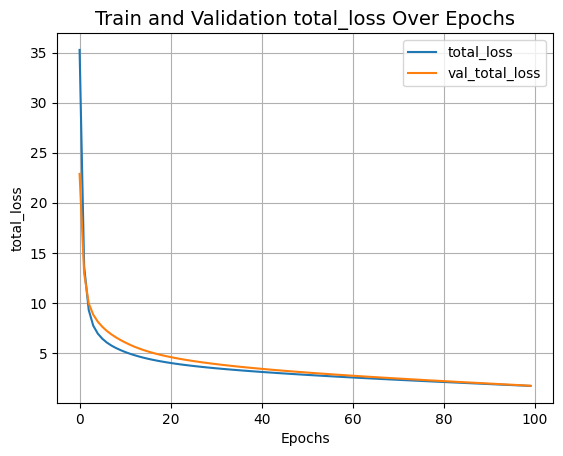

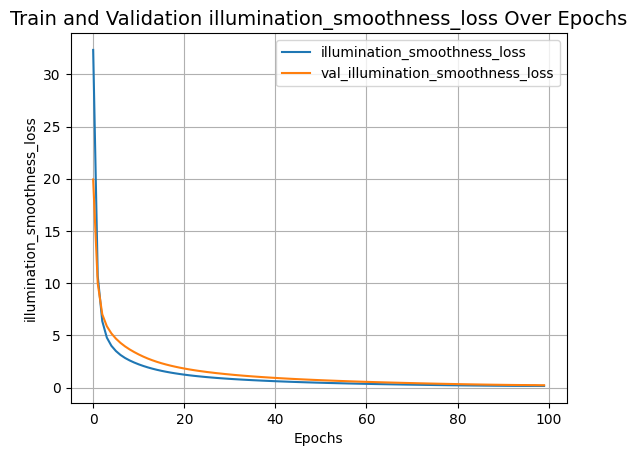

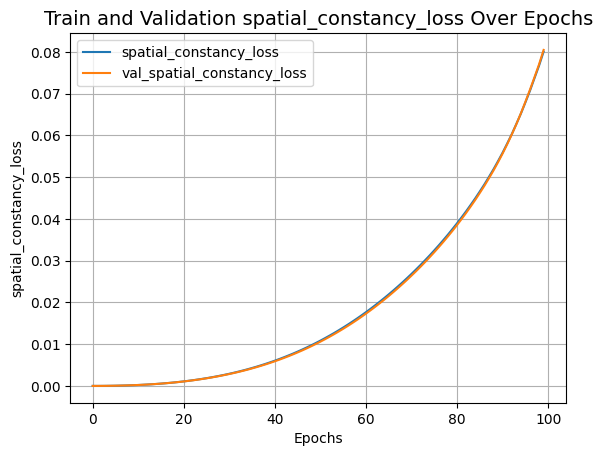

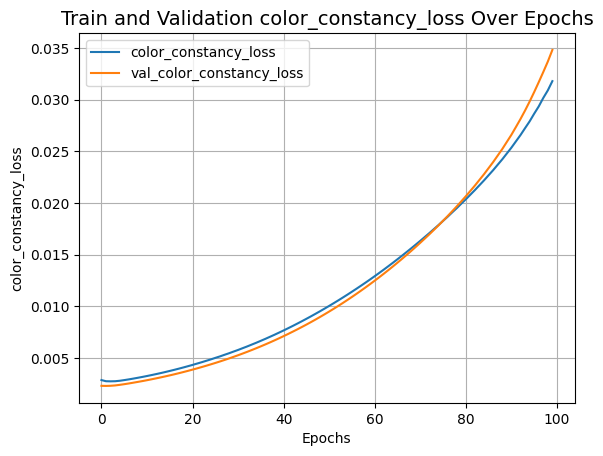

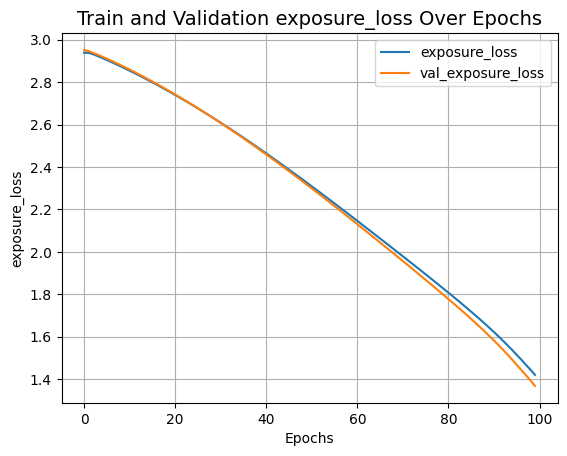

In [15]:
zero_dce_model = ZeroDCE()
zero_dce_model.compile(learning_rate = 1e-4)
history = zero_dce_model.fit(train_dataset, validation_data = val_dataset, epochs = 100)

#Function to plot result to show losses during training
def plot_result(item):
    plt.plot(history.history[item], label = item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")

## Results
### Seeing the test results, compared to the original image and that enhanced by the MirNet model (PIL.ImageOps.autoconstrast)

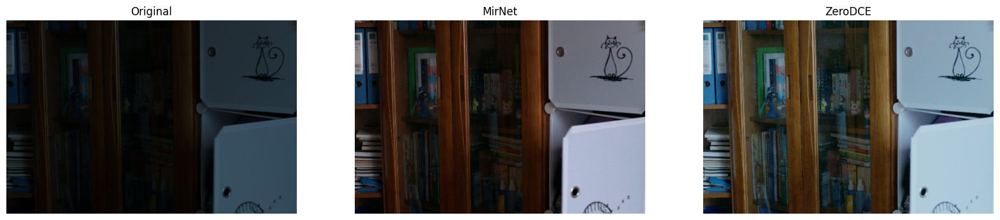

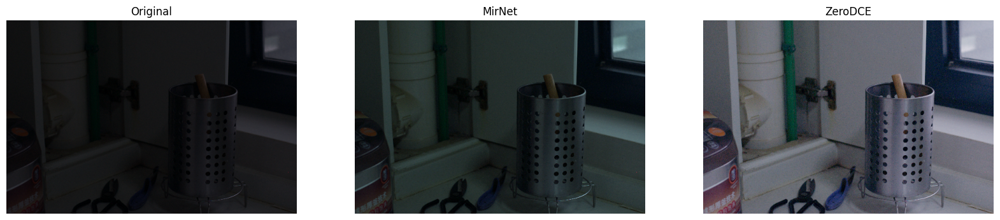

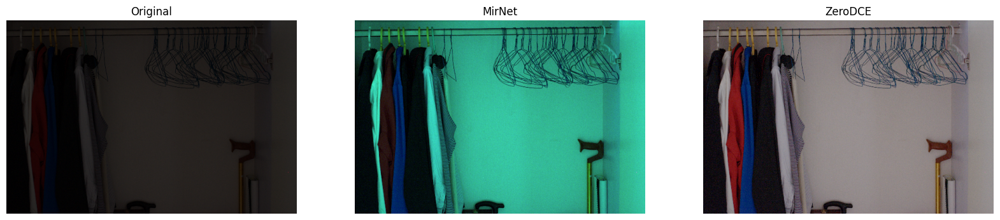

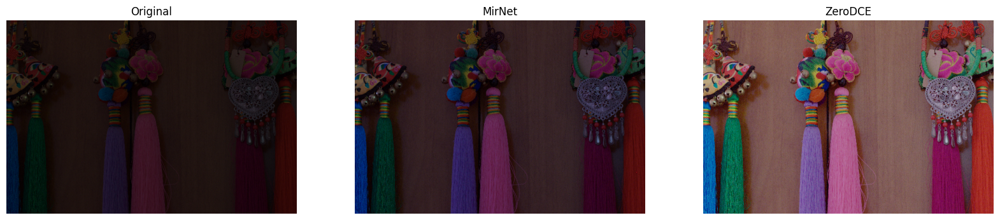

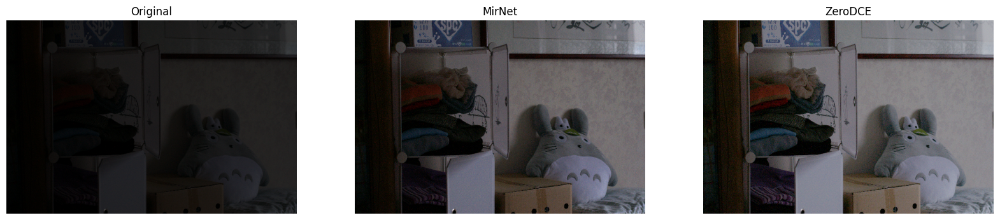

...

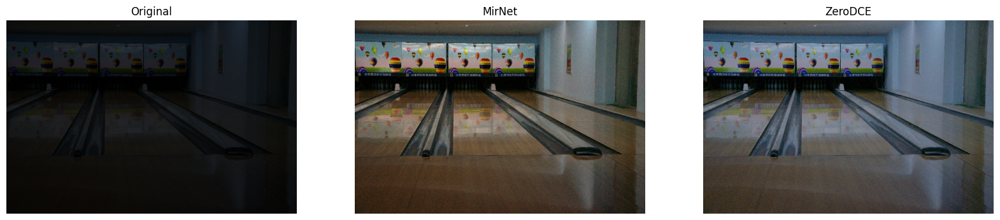

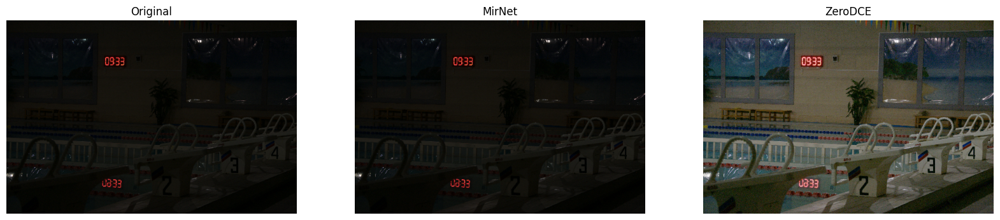

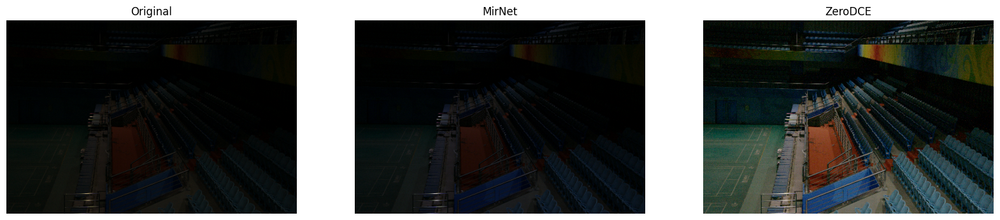

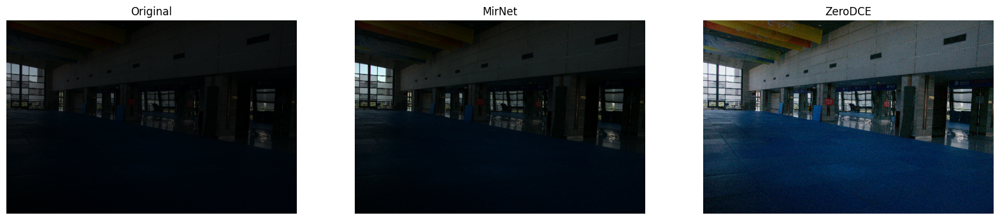

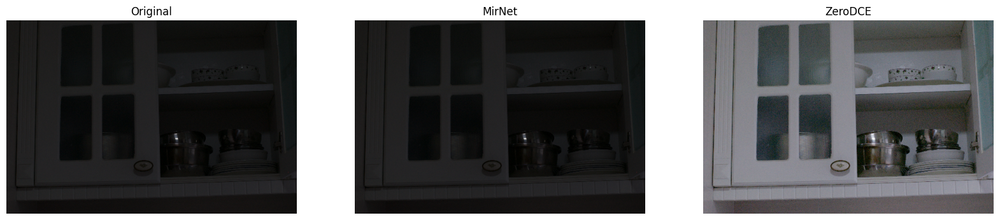

In [16]:
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()


def infer(original_image):
    image = keras.utils.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

for val_image_file in test_low_light_images:
    original_image = Image.open(val_image_file)
    enhanced_image = infer(original_image)
    plot_results(
        [original_image, ImageOps.autocontrast(original_image), enhanced_image],
        ["Original", "MirNet", "ZeroDCE"],
        (20, 12),
    )